# Urban Expansion: Tracking City Growth from Space

In this notebook, we'll use the **NDBI (Normalized Difference Built-up Index)** to track urban expansion over time.

**What we'll discover:**
1. NDBI highlights built-up areas (concrete, asphalt, buildings)
2. Comparing years reveals urban sprawl patterns
3. We can quantify exactly how much a city has grown

**Why this matters:**
- Urban planners need to track development patterns
- Environmental agencies monitor habitat loss
- Infrastructure planning requires growth projections
- Climate researchers study urban heat islands

---
## 1. Setup

In [23]:
from pystac_client import Client
import planetary_computer as pc
from odc.stac import stac_load

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.patches as mpatches
import warnings
warnings.filterwarnings('ignore')

catalog = Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")
print("Connected to Planetary Computer")

Connected to Planetary Computer


---
## 2. Understanding NDBI (Built-up Index)

**NDBI (Normalized Difference Built-up Index)** detects urban/built-up areas:

$$NDBI = \frac{SWIR - NIR}{SWIR + NIR}$$

**Why it works:**
- Built-up surfaces (concrete, asphalt, rooftops) **reflect SWIR** strongly
- Vegetation **reflects NIR** strongly but absorbs SWIR
- Result: Urban areas have **positive NDBI**, vegetation has **negative NDBI**

| NDBI Value | Interpretation |
|------------|----------------|
| > 0.1 | Built-up/urban areas |
| -0.1 to 0.1 | Bare soil, sparse vegetation |
| < -0.1 | Vegetation, water |

**Sentinel-2 bands used:**
- **B11 (SWIR1)** — 1610 nm wavelength
- **B08 (NIR)** — 842 nm wavelength

---
## 3. Select a Growing City

We'll analyze **Ahmedabad, India** — one of India's fastest-growing metropolitan areas and a major industrial hub in Gujarat.

- **Location:** Gujarat, Western India
- **Population Growth:** From ~6 million (2016) to ~8+ million (2024)
- **Pattern:** Rapid expansion of residential, commercial, and industrial areas

We'll compare the **same area** in **2016** vs **2024** to see 8 years of urban expansion.

In [24]:
# Ahmedabad, India - Urban expansion zone
# Converting from lat,lon points to bbox [min_lon, min_lat, max_lon, max_lat]
city_name = "Ahmedabad, Gujarat, India"
bbox = [72.505, 22.926, 72.669, 23.120]

# Time periods - same season, different years
# Using winter/spring to avoid monsoon clouds (Nov-March is best for India)
early_year_date = "2016-11-01/2017-02-28"   # Early Sentinel-2 era
recent_year_date = "2024-11-01/2025-01-25"  # Recent

print(f"Analysis: {city_name}")
print(f"Early year:  {early_year_date}")
print(f"Recent year: {recent_year_date}")

Analysis: Ahmedabad, Gujarat, India
Early year:  2016-11-01/2017-02-28
Recent year: 2024-11-01/2025-01-25


---
## 4. Helper Functions

In [25]:
def normalize_for_display(img, pmin=2, pmax=98):
    """Normalize image to 0-1 range for display."""
    lo, hi = np.nanpercentile(img, [pmin, pmax])
    return np.clip((img - lo) / (hi - lo + 1e-6), 0, 1)

def compute_ndbi(swir, nir):
    """Compute Normalized Difference Built-up Index: (SWIR - NIR) / (SWIR + NIR)"""
    swir = swir.astype('float32')
    nir = nir.astype('float32')
    return (swir - nir) / (swir + nir + 1e-6)

def compute_ndvi(nir, red):
    """Compute Normalized Difference Vegetation Index: (NIR - Red) / (NIR + Red)"""
    nir = nir.astype('float32')
    red = red.astype('float32')
    return (nir - red) / (nir + red + 1e-6)

def load_image(catalog, bbox, date_range, max_cloud=10):
    """Load a Sentinel-2 image for the given location and date range."""
    search = catalog.search(
        collections=["sentinel-2-l2a"],
        bbox=bbox,
        datetime=date_range,
        query={"eo:cloud_cover": {"lt": max_cloud}},
    )
    items = list(search.items())
    
    if len(items) == 0:
        print(f"  No images with <{max_cloud}% clouds. Trying with <20% clouds...")
        search = catalog.search(
            collections=["sentinel-2-l2a"],
            bbox=bbox,
            datetime=date_range,
            query={"eo:cloud_cover": {"lt": 20}},
        )
        items = list(search.items())
    
    if len(items) == 0:
        raise ValueError(f"No images found for {date_range}")
    
    # Get clearest image
    items_sorted = sorted(items, key=lambda x: x.properties.get('eo:cloud_cover', 100))
    item = items_sorted[0]
    
    signed_item = pc.sign(item)
    data = stac_load(
        [signed_item],
        bands=["B02", "B03", "B04", "B08", "B11"],  # Blue, Green, Red, NIR, SWIR1
        bbox=bbox,
        crs="EPSG:4326",
        resolution=0.0002,
        groupby="solar_day",
    )
    
    return data, item

print("Helper functions defined.")

Helper functions defined.


---
## 5. Load Images from Both Years

In [26]:
print("Loading EARLY year image (2018)...")
early_data, early_item = load_image(catalog, bbox, early_year_date)
print(f"  Date: {early_item.datetime.strftime('%Y-%m-%d')}")
print(f"  Cloud cover: {early_item.properties.get('eo:cloud_cover', 0):.1f}%")
print(f"  Data dimensions: {dict(early_data.dims)}")

print("\nLoading RECENT year image (2024)...")
recent_data, recent_item = load_image(catalog, bbox, recent_year_date)
print(f"  Date: {recent_item.datetime.strftime('%Y-%m-%d')}")
print(f"  Cloud cover: {recent_item.properties.get('eo:cloud_cover', 0):.1f}%")
print(f"  Data dimensions: {dict(recent_data.dims)}")

Loading EARLY year image (2018)...
  Date: 2016-11-14
  Cloud cover: 0.1%
  Data dimensions: {'latitude': 970, 'longitude': 820, 'time': 1}

Loading RECENT year image (2024)...
  Date: 2024-11-27
  Cloud cover: 0.0%
  Data dimensions: {'latitude': 970, 'longitude': 820, 'time': 1}


---
## 6. Extract Bands and Create Composites

In [27]:
# Extract bands for early year
early_red = early_data["B04"].isel(time=0).values
early_green = early_data["B03"].isel(time=0).values
early_blue = early_data["B02"].isel(time=0).values
early_nir = early_data["B08"].isel(time=0).values
early_swir = early_data["B11"].isel(time=0).values

# Extract bands for recent year
recent_red = recent_data["B04"].isel(time=0).values
recent_green = recent_data["B03"].isel(time=0).values
recent_blue = recent_data["B02"].isel(time=0).values
recent_nir = recent_data["B08"].isel(time=0).values
recent_swir = recent_data["B11"].isel(time=0).values

# Create RGB composites
early_rgb = normalize_for_display(np.stack([early_red, early_green, early_blue], axis=-1))
recent_rgb = normalize_for_display(np.stack([recent_red, recent_green, recent_blue], axis=-1))

# Check the shape
print(f"Image shape: {early_rgb.shape}")
img_height, img_width = early_rgb.shape[:2]
aspect_ratio = img_width / img_height
print(f"  Aspect ratio (w/h): {aspect_ratio:.2f}")

Image shape: (970, 820, 3)
  Aspect ratio (w/h): 0.85


---
## 7. True Color Comparison

First, let's see if we can spot the urban growth in true color.

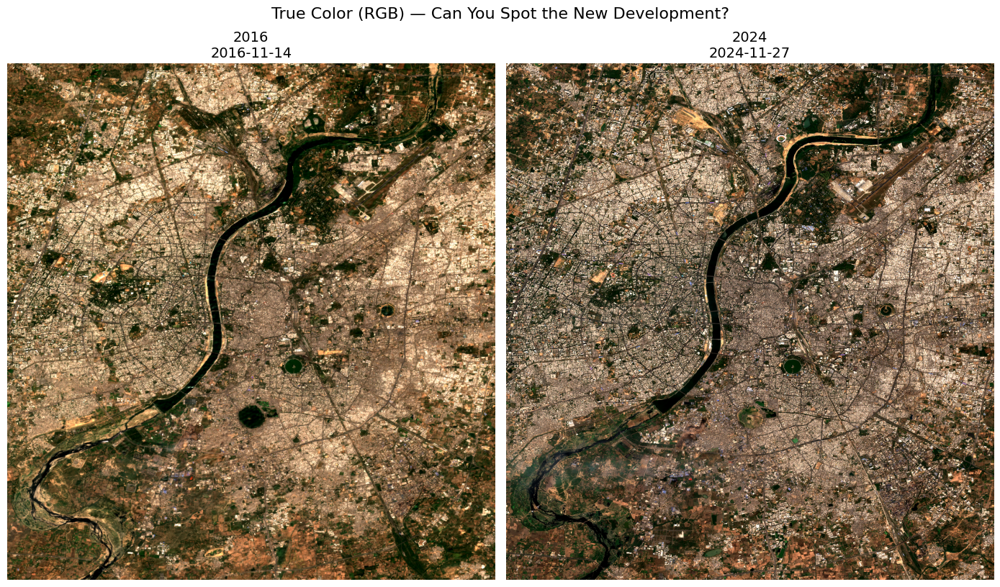

In [28]:
# Figure size based on image aspect ratio
img_height, img_width = early_rgb.shape[:2]
aspect_ratio = img_width / img_height

subplot_width = 7
subplot_height = subplot_width / aspect_ratio
fig, axes = plt.subplots(1, 2, figsize=(subplot_width * 2, subplot_height))

axes[0].imshow(early_rgb, aspect='auto')
axes[0].set_title(f"{early_item.datetime.year}\n{early_item.datetime.strftime('%Y-%m-%d')}", fontsize=14)
axes[0].axis('off')

axes[1].imshow(recent_rgb, aspect='auto')
axes[1].set_title(f"{recent_item.datetime.year}\n{recent_item.datetime.strftime('%Y-%m-%d')}", fontsize=14)
axes[1].axis('off')

plt.suptitle("True Color (RGB) — Can You Spot the New Development?", fontsize=16)
plt.tight_layout()
plt.show()

### What can you see in true color?

You might notice:
- New **gray/white patches** — new subdivisions and roads
- **Geometric patterns** — new street grids in former desert
- But it's hard to precisely quantify how much has changed

**NDBI will make the urban areas pop out clearly...**

---
## 8. Compute NDBI (Built-up Index)

In [29]:
# Compute NDBI for both years
early_ndbi = compute_ndbi(early_swir, early_nir)
recent_ndbi = compute_ndbi(recent_swir, recent_nir)

print(f"Early Year NDBI:  min={np.nanmin(early_ndbi):.2f}, max={np.nanmax(early_ndbi):.2f}, mean={np.nanmean(early_ndbi):.2f}")
print(f"Recent Year NDBI: min={np.nanmin(recent_ndbi):.2f}, max={np.nanmax(recent_ndbi):.2f}, mean={np.nanmean(recent_ndbi):.2f}")

# Count urban pixels (NDBI > 0.1)
early_urban_pct = 100 * np.sum(early_ndbi > 0.1) / early_ndbi.size
recent_urban_pct = 100 * np.sum(recent_ndbi > 0.1) / recent_ndbi.size
print(f"\nUrban coverage (NDBI > 0.1):")
print(f"  {early_item.datetime.year}: {early_urban_pct:.1f}%")
print(f"  {recent_item.datetime.year}: {recent_urban_pct:.1f}%")
print(f"  Growth: +{recent_urban_pct - early_urban_pct:.1f} percentage points")

Early Year NDBI:  min=-0.77, max=0.47, mean=0.01
Recent Year NDBI: min=-0.53, max=0.44, mean=0.00

Urban coverage (NDBI > 0.1):
  2016: 10.7%
  2024: 9.1%
  Growth: +-1.6 percentage points


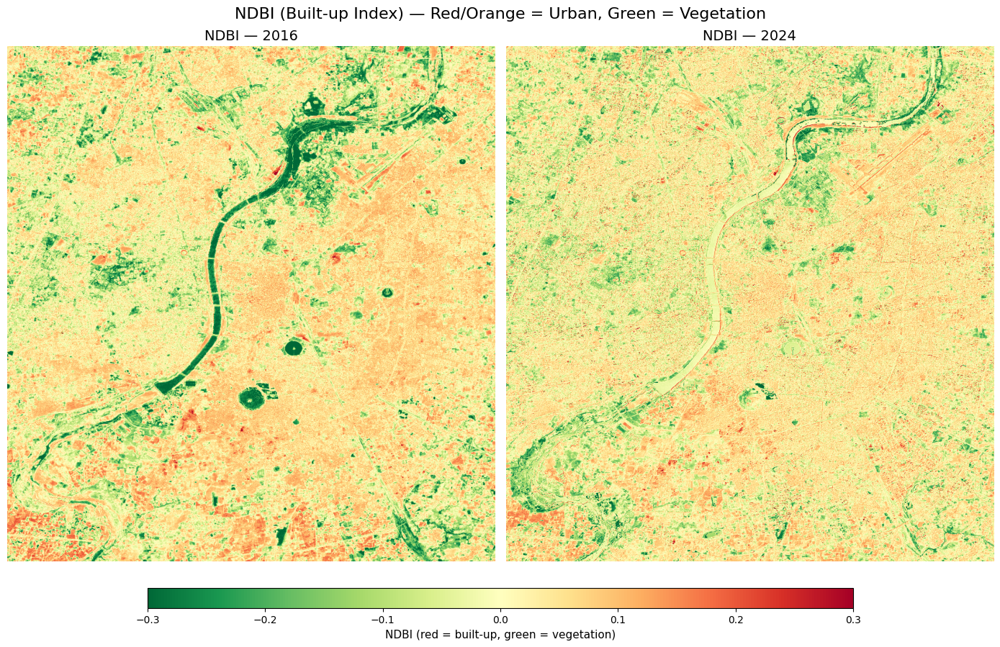

In [30]:
# Figure size based on aspect ratio
img_height, img_width = early_ndbi.shape
aspect_ratio = img_width / img_height

subplot_width = 7
subplot_height = subplot_width / aspect_ratio
fig, axes = plt.subplots(1, 2, figsize=(subplot_width * 2, subplot_height + 1))

# Use a colormap that highlights urban areas: brown/orange for built-up, green for vegetation
im0 = axes[0].imshow(early_ndbi, cmap='RdYlGn_r', vmin=-0.3, vmax=0.3, aspect='auto')
axes[0].set_title(f"NDBI — {early_item.datetime.year}", fontsize=14)
axes[0].axis('off')

im1 = axes[1].imshow(recent_ndbi, cmap='RdYlGn_r', vmin=-0.3, vmax=0.3, aspect='auto')
axes[1].set_title(f"NDBI — {recent_item.datetime.year}", fontsize=14)
axes[1].axis('off')

plt.suptitle("NDBI (Built-up Index) — Red/Orange = Urban, Green = Vegetation", fontsize=16)
plt.tight_layout()

cbar_ax = fig.add_axes([0.15, 0.08, 0.7, 0.03])
cbar = fig.colorbar(im1, cax=cbar_ax, orientation='horizontal')
cbar.set_label('NDBI (red = built-up, green = vegetation)', fontsize=11)
plt.subplots_adjust(bottom=0.15)
plt.show()

### What NDBI reveals:

Now the urban growth is obvious:
- **Red/orange areas** = built-up surfaces (concrete, asphalt, rooftops)
- **Green areas** = vegetation (parks, farms, natural areas)
- **Yellow areas** = bare soil, desert, transitional zones

Compare the two years — you can clearly see new red patches where development occurred!

---
## 9. Compute Urban Change (dNDBI)

Let's quantify the urban expansion:

$$dNDBI = NDBI_{recent} - NDBI_{early}$$

**Interpretation:**
- **High positive dNDBI:** Area became more built-up → **new development**
- **Near zero:** No significant change
- **Negative dNDBI:** Area became less built-up (rare) or greener

In [31]:
# Compute dNDBI (change in built-up index)
dndbi = recent_ndbi - early_ndbi

print(f"dNDBI statistics:")
print(f"  Min: {np.nanmin(dndbi):.2f}")
print(f"  Max: {np.nanmax(dndbi):.2f}")
print(f"  Mean: {np.nanmean(dndbi):.2f}")

# Count new development pixels
new_development = np.sum(dndbi > 0.1)  # Significant increase in built-up
total_pixels = dndbi.size
print(f"\nNew development (dNDBI > 0.1): {100 * new_development / total_pixels:.1f}% of area")

dNDBI statistics:
  Min: -0.56
  Max: 0.77
  Mean: -0.00

New development (dNDBI > 0.1): 12.2% of area


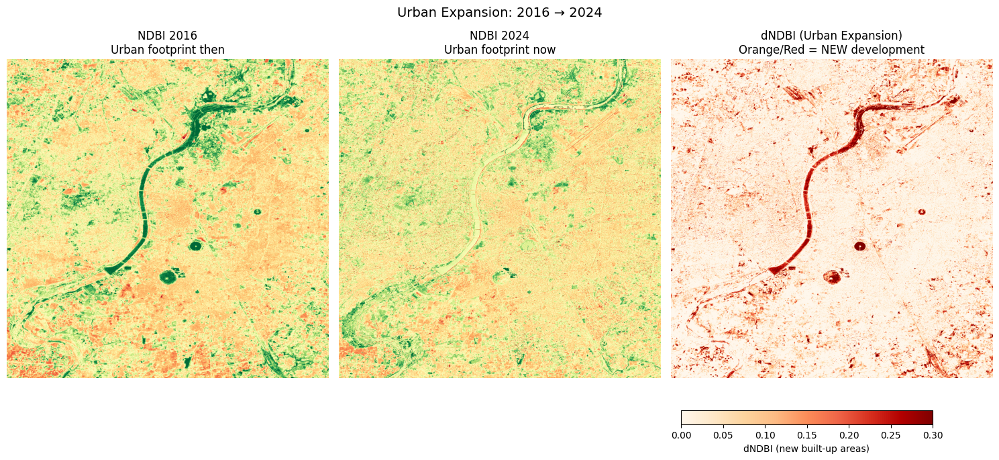

In [32]:
# Figure size for 3 subplots
img_height, img_width = dndbi.shape
aspect_ratio = img_width / img_height

subplot_width = 5
subplot_height = subplot_width / aspect_ratio
fig, axes = plt.subplots(1, 3, figsize=(subplot_width * 3, subplot_height + 1))

# Early year NDBI
im0 = axes[0].imshow(early_ndbi, cmap='RdYlGn_r', vmin=-0.3, vmax=0.3, aspect='auto')
axes[0].set_title(f"NDBI {early_item.datetime.year}\nUrban footprint then", fontsize=12)
axes[0].axis('off')

# Recent year NDBI
im1 = axes[1].imshow(recent_ndbi, cmap='RdYlGn_r', vmin=-0.3, vmax=0.3, aspect='auto')
axes[1].set_title(f"NDBI {recent_item.datetime.year}\nUrban footprint now", fontsize=12)
axes[1].axis('off')

# dNDBI - urban expansion
im2 = axes[2].imshow(dndbi, cmap='OrRd', vmin=0, vmax=0.3, aspect='auto')
axes[2].set_title("dNDBI (Urban Expansion)\nOrange/Red = NEW development", fontsize=12)
axes[2].axis('off')

plt.suptitle(f"Urban Expansion: {early_item.datetime.year} → {recent_item.datetime.year}", fontsize=14)
plt.tight_layout()

cbar_ax = fig.add_axes([0.68, 0.08, 0.25, 0.03])
cbar = fig.colorbar(im2, cax=cbar_ax, orientation='horizontal')
cbar.set_label('dNDBI (new built-up areas)', fontsize=10)
plt.subplots_adjust(bottom=0.18)
plt.show()

---
## 10. Classify Land Use Change

In [33]:
def classify_urban_change(early_ndbi, recent_ndbi, dndbi):
    """
    Classify urban change based on NDBI values.
    Returns integer classes:
    0 = Stable urban (was urban, still urban)
    1 = New development (was not urban, now urban)
    2 = Stable non-urban (was not urban, still not urban)
    3 = Vegetation gain (area became greener)
    """
    change = np.zeros_like(dndbi, dtype=np.int8)
    
    urban_threshold = 0.05  # NDBI threshold for "urban"
    change_threshold = 0.08  # Minimum change to be significant
    
    # Stable urban: was urban, still urban
    change[(early_ndbi > urban_threshold) & (recent_ndbi > urban_threshold)] = 0
    
    # New development: was NOT urban, now IS urban
    change[(early_ndbi <= urban_threshold) & (recent_ndbi > urban_threshold)] = 1
    
    # Also count areas with significant NDBI increase even if below threshold
    change[(dndbi > change_threshold) & (change != 0) & (change != 1)] = 1
    
    # Stable non-urban: was not urban, still not urban, no significant change
    change[(early_ndbi <= urban_threshold) & (recent_ndbi <= urban_threshold) & (np.abs(dndbi) <= change_threshold)] = 2
    
    # Vegetation gain: significant decrease in NDBI (became greener)
    change[dndbi < -change_threshold] = 3
    
    return change

change_map = classify_urban_change(early_ndbi, recent_ndbi, dndbi)

# Count pixels in each class
print("Urban Change Classification:")
print("-" * 50)
change_names = ['Stable Urban', 'New Development', 'Stable Non-Urban', 'Vegetation Gain']
for i, name in enumerate(change_names):
    count = np.sum(change_map == i)
    pct = 100 * count / change_map.size
    print(f"  {name:18s}: {pct:5.1f}% of area")

Urban Change Classification:
--------------------------------------------------
  Stable Urban      :  34.3% of area
  New Development   :  13.1% of area
  Stable Non-Urban  :  36.0% of area
  Vegetation Gain   :  16.5% of area


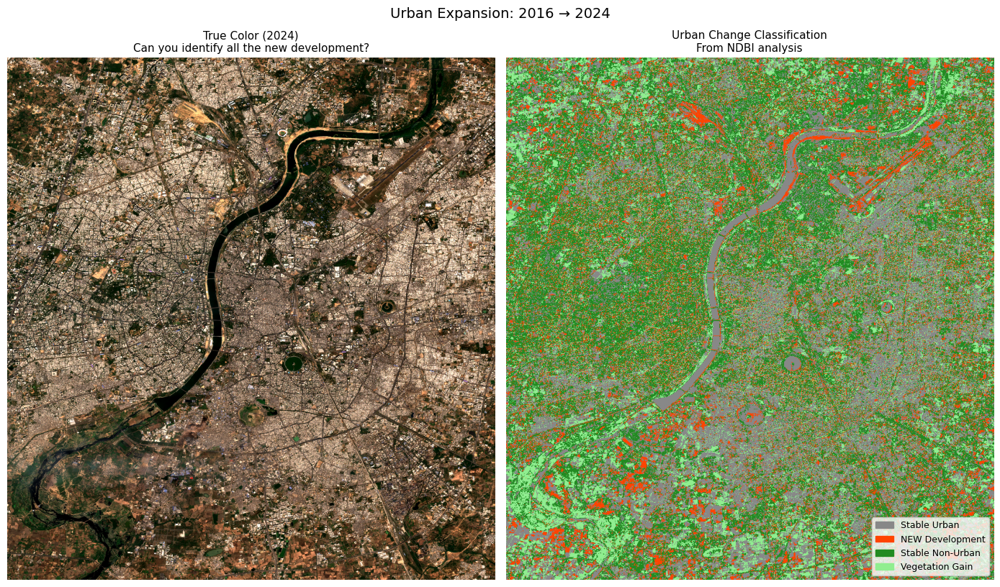

In [34]:
# Create a custom colormap for change classes
colors = ['#888888', '#FF4400', '#228B22', '#90EE90']  # Gray, Red-Orange, Dark Green, Light Green
cmap_change = ListedColormap(colors)
bounds = [-0.5, 0.5, 1.5, 2.5, 3.5]
norm = BoundaryNorm(bounds, cmap_change.N)

# Figure size based on aspect ratio
img_height, img_width = change_map.shape
aspect_ratio = img_width / img_height

subplot_width = 7
subplot_height = subplot_width / aspect_ratio
fig, axes = plt.subplots(1, 2, figsize=(subplot_width * 2, subplot_height))

# True color recent year
axes[0].imshow(recent_rgb, aspect='auto')
axes[0].set_title(f"True Color ({recent_item.datetime.year})\nCan you identify all the new development?", fontsize=11)
axes[0].axis('off')

# Classified change map
im = axes[1].imshow(change_map, cmap=cmap_change, norm=norm, aspect='auto')
axes[1].set_title("Urban Change Classification\nFrom NDBI analysis", fontsize=11)
axes[1].axis('off')

# Add legend
patches = [
    mpatches.Patch(color=colors[0], label='Stable Urban'),
    mpatches.Patch(color=colors[1], label='NEW Development'),
    mpatches.Patch(color=colors[2], label='Stable Non-Urban'),
    mpatches.Patch(color=colors[3], label='Vegetation Gain'),
]
axes[1].legend(handles=patches, loc='lower right', fontsize=9)

plt.suptitle(f"Urban Expansion: {early_item.datetime.year} → {recent_item.datetime.year}", fontsize=14)
plt.tight_layout()
plt.show()

---
## 11. Urban Expansion Report

In [35]:
# Calculate approximate areas
pixel_area_hectares = 0.04  # Approximate hectares per pixel at this resolution

years_diff = recent_item.datetime.year - early_item.datetime.year

print("="*60)
print("URBAN EXPANSION REPORT")
print("="*60)
print(f"Location: {city_name}")
print(f"Period: {early_item.datetime.year} to {recent_item.datetime.year} ({years_diff} years)")
print("="*60)

# Urban coverage statistics
early_urban_area = np.sum(early_ndbi > 0.05) * pixel_area_hectares
recent_urban_area = np.sum(recent_ndbi > 0.05) * pixel_area_hectares
new_dev_area = np.sum(change_map == 1) * pixel_area_hectares

print(f"\nUrban Footprint:")
print(f"  {early_item.datetime.year}: ~{early_urban_area:.0f} hectares")
print(f"  {recent_item.datetime.year}: ~{recent_urban_area:.0f} hectares")
print(f"  Growth: +{recent_urban_area - early_urban_area:.0f} hectares ({100*(recent_urban_area-early_urban_area)/early_urban_area:.1f}% increase)")

print("\n" + "-"*60)
print("Change Classification:")
print("-"*60)

implications = [
    "Existing infrastructure - maintenance focus",
    "NEW DEVELOPMENT - requires new services, roads, utilities",
    "Undeveloped land - potential future growth area",
    "Green space added - parks, landscaping, or agriculture"
]

for i, name in enumerate(change_names):
    count = np.sum(change_map == i)
    pct = 100 * count / change_map.size
    area = count * pixel_area_hectares
    
    print(f"\n{name}:")
    print(f"  Coverage: {pct:.1f}% (~{area:.0f} hectares)")
    print(f"  Implication: {implications[i]}")

print("\n" + "="*60)
print(f"Annual growth rate: ~{new_dev_area/years_diff:.0f} hectares/year")
print("="*60)
print("\nThis report was generated automatically from satellite data.")
print("NDBI analysis objectively tracks urban development patterns.")
print("="*60)

URBAN EXPANSION REPORT
Location: Ahmedabad, Gujarat, India
Period: 2016 to 2024 (8 years)

Urban Footprint:
  2016: ~11647 hectares
  2024: ~9377 hectares
  Growth: +-2270 hectares (-19.5% increase)

------------------------------------------------------------
Change Classification:
------------------------------------------------------------

Stable Urban:
  Coverage: 34.3% (~10923 hectares)
  Implication: Existing infrastructure - maintenance focus

New Development:
  Coverage: 13.1% (~4176 hectares)
  Implication: NEW DEVELOPMENT - requires new services, roads, utilities

Stable Non-Urban:
  Coverage: 36.0% (~11459 hectares)
  Implication: Undeveloped land - potential future growth area

Vegetation Gain:
  Coverage: 16.5% (~5258 hectares)
  Implication: Green space added - parks, landscaping, or agriculture

Annual growth rate: ~522 hectares/year

This report was generated automatically from satellite data.
NDBI analysis objectively tracks urban development patterns.


---
## 12. Full Comparison View

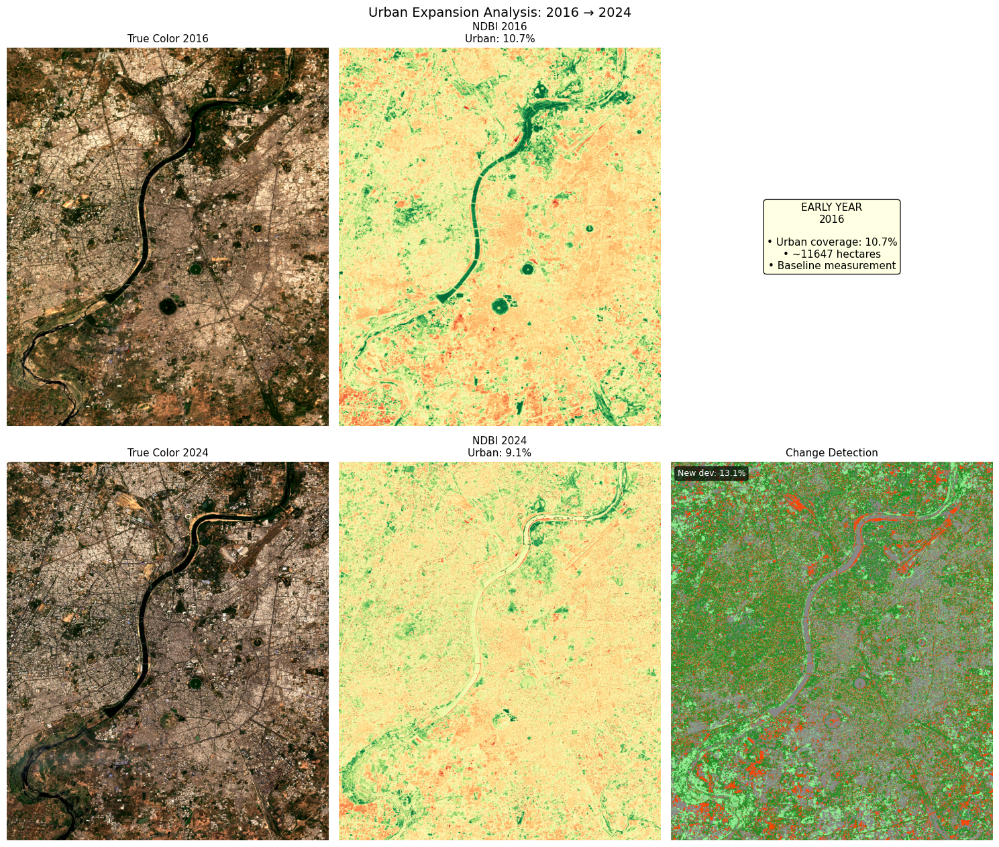

In [36]:
# Figure size for 2x3 grid based on image aspect ratio
img_height, img_width = early_rgb.shape[:2]
aspect_ratio = img_width / img_height

subplot_width = 5
subplot_height = subplot_width / aspect_ratio
fig, axes = plt.subplots(2, 3, figsize=(subplot_width * 3, subplot_height * 2 + 1))

# Row 1: Early Year
axes[0, 0].imshow(early_rgb, aspect='auto')
axes[0, 0].set_title(f"True Color {early_item.datetime.year}", fontsize=11)
axes[0, 0].axis('off')

im_early = axes[0, 1].imshow(early_ndbi, cmap='RdYlGn_r', vmin=-0.3, vmax=0.3, aspect='auto')
axes[0, 1].set_title(f"NDBI {early_item.datetime.year}\nUrban: {early_urban_pct:.1f}%", fontsize=11)
axes[0, 1].axis('off')

axes[0, 2].axis('off')
axes[0, 2].text(0.5, 0.5, f"EARLY YEAR\n{early_item.datetime.year}\n\n• Urban coverage: {early_urban_pct:.1f}%\n• ~{early_urban_area:.0f} hectares\n• Baseline measurement",
                transform=axes[0, 2].transAxes, fontsize=11, ha='center', va='center',
                bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.9))

# Row 2: Recent Year
axes[1, 0].imshow(recent_rgb, aspect='auto')
axes[1, 0].set_title(f"True Color {recent_item.datetime.year}", fontsize=11)
axes[1, 0].axis('off')

im_recent = axes[1, 1].imshow(recent_ndbi, cmap='RdYlGn_r', vmin=-0.3, vmax=0.3, aspect='auto')
axes[1, 1].set_title(f"NDBI {recent_item.datetime.year}\nUrban: {recent_urban_pct:.1f}%", fontsize=11)
axes[1, 1].axis('off')

axes[1, 2].imshow(change_map, cmap=cmap_change, norm=norm, aspect='auto')
axes[1, 2].set_title("Change Detection", fontsize=11)
axes[1, 2].axis('off')
new_dev_pct = 100 * np.sum(change_map == 1) / change_map.size
axes[1, 2].text(0.02, 0.98, f"New dev: {new_dev_pct:.1f}%", transform=axes[1, 2].transAxes,
                fontsize=9, va='top', color='white', bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))

plt.suptitle(f"Urban Expansion Analysis: {early_item.datetime.year} → {recent_item.datetime.year}", fontsize=14)
plt.tight_layout()
plt.show()

---
## Summary: Urban Expansion Detection with NDBI

### What we learned:

| Index | Formula | What it detects |
|-------|---------|------------------|
| **NDBI** | (SWIR - NIR) / (SWIR + NIR) | Built-up/urban areas |
| **dNDBI** | NDBI_recent - NDBI_early | New development |

### Key insight:

While true color images show "there's a city here," NDBI allows us to:
- **Precisely map** the urban boundary
- **Quantify growth** in hectares or square kilometers
- **Track patterns** — where is development happening?
- **Calculate rates** — how fast is the city growing?

### Real-world applications:

| Application | How NDBI analysis helps |
|-------------|-------------------------|
| Urban planning | Track sprawl, plan infrastructure |
| Environmental | Monitor habitat loss, green space |
| Real estate | Identify development hotspots |
| Climate | Study urban heat island growth |
| Policy | Enforce zoning, growth boundaries |